In [ ]:
!rm -rf my_dir
!rm -rf sample_data
!pip install -q -U keras-tuner
import kerastuner as kt

In [ ]:
!unzip train_and_test_data.zip

Archive:  train_and_test_data.zip
  inflating: X_test_dev.csv          
  inflating: X_train.csv             
  inflating: y_test_dev.npy          
  inflating: y_values.npz            
  inflating: X_test.csv              


# Imports
Here the imports are listed, which are important for the model

In [ ]:
import numpy
import sklearn
from sklearn import metrics
from sklearn.model_selection import KFold
import tensorflow as tf
#from tensorflow.keras.layers.experimental import preprocessing
from tensorflow import keras
from tensorflow.keras import layers
import matplotlib.pyplot as plt
import pandas as pd
from tensorflow.keras.layers.experimental.preprocessing import TextVectorization


#logger
import logging
logger = logging.getLogger()
logger.setLevel(logging.INFO)

#type annotation
from typing import *
tf.get_logger().setLevel('ERROR')

import gc
gc.enable()

vocab_size = 20000
sequence_length = 500#200
AUTOTUNE = tf.data.AUTOTUNE
SEED = 100
embedding_dim = 128
from tensorflow.keras.layers import Embedding

#Loading the data
This code is used for loading the data.

In [ ]:
npzfile = numpy.load("y_values.npz")
npzfile.files

#Y:numpy.ndarray = npzfile['arr_0']
Y:numpy.ndarray = npzfile['arr_1']
#X_train:numpy.ndarray = pd.read_csv("X_train.csv")[["IssueA", "IssueB"]].values.astype("str")
def loadX() -> numpy.ndarray:
  result = None
  for chunk in pd.read_csv("X_train.csv", chunksize=500):
    data = chunk[["IssueA", "IssueB"]]
    chunk_result = data.values.astype("str")
    if result is None:
        result = chunk_result
        print(result[:3])
    else:
        result = numpy.concatenate((result, chunk_result), axis=0)
  print(result.shape)
  #for chunk in pd.read_csv("X_test.csv", chunksize=500):
  #  data = chunk[["IssueA", "IssueB"]]
  #  chunk_result = data.values.astype("str")
  #  if result is None:
  #      result = chunk_result
  #      print(result)
  #  else:
  #      result = numpy.concatenate((result, chunk_result), axis=0)
  return result
X = loadX()
#xtest = pd.read_csv("X_test.csv")[["IssueA", "IssueB"]].values.astype("str") 

#lists for keras
#X_train_list: List[numpy.ndarray] = [X_train[:,0],X_train[:,1]]# list of numpy.ndarray[str]
#X_test_list: List[numpy.ndarray] = [X_test[:,0],X_test[:,1]]# list of numpy.ndarray[str]

#logger.info(Y.shape)
#logger.info(Y_test.shape)
#logger.info(X_train.shape)
#logger.info(X_test.shape)
del npzfile

[["Fresh install of L5.5 - 'npm run dev' crashes\n- Laravel Mix Version: #.#.# (`npm list --depth=0`)\r\n\r\nlaravel-mix@1.4.2\r\n\r\n- Node Version (`node -v`): \r\n\r\n8.4.0\r\n\r\n- NPM Version (`npm -v`): \r\n\r\n5.4.0\r\n\r\n- OS: \r\n\r\nMacOS 10.12.6\r\n\r\n### Description:\r\n\r\n`npm run dev` seems to compile assests, but crashes while running.  I've tried force clearing the npm cache, grabbing the latest package.json from the Laravel repo etc.\r\n\r\n### Steps To Reproduce:\r\n\r\n`laravel new testeroo && cd testeroo && npm install && npm run dev`\r\n\r\n(but essentially the `npm run dev` section)\r\n\r\n### Produces \r\n\r\n```\r\n\r\n> @ dev /Users/ohffs/Documents/code/testeroo\r\n> npm run development\r\n\r\n\r\n> @ development /Users/ohffs/Documents/code/testeroo\r\n> cross-env NODE_ENV=development node_modules/webpack/bin/webpack.js --progress --hide-modules --config=node_modules/laravel-mix/setup/webpack.config.js\r\n\r\n 95% emitting                                    

#Classifier


In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
import tensorflow_hub as hub



def getVectoriser(kind = "tfIdf", vocab=512, ngrams=(1,1), trainingsData=None):
  global vectoriser_func
  if kind is "tfIdf":
    vectoriser = TfidfVectorizer(lowercase=True, min_df=2, max_features=vocab)
    trainVectoriser(vectoriser, trainingsData)
    return vectoriser
  elif kind is "count":
    vectoriser = CountVectorizer(lowercase=True, min_df=2, max_features=vocab)
    trainVectoriser(vectoriser, trainingsData)
    return vectoriser

def trainVectoriser(vectoriser, trainingsData):
  text_ds = trainingsData.flatten()
  tmp = vectoriser.fit_transform(text_ds)
  print(tmp.shape)
  print(text_ds.shape)
  del text_ds, tmp
  gc.collect()

def batchVectorisation(dfData, vectoriser):
  l = dfData[:,0]
  r = dfData[:,1]
  returnValue = [[],[]]
  batch_size = 250
  while len(l) >0 :
    le = vectoriser.transform(l[:batch_size]).toarray()
    re = vectoriser.transform(r[:batch_size]).toarray()

    if len(returnValue[0]) == 0:
      returnValue[0] = le
      returnValue[1] = re
    else:
      returnValue[0] = numpy.concatenate((returnValue[0], le), axis=0)
      returnValue[1] = numpy.concatenate((returnValue[1], re), axis=0)

    l = l[batch_size:]
    r = r[batch_size:]
    print(f"{returnValue[0].shape} todo {l.shape}")
  return returnValue

def vectoriseData(vectoriser, training, validation):
  X_train_list = batchVectorisation(training, vectoriser)
  X_test_list = batchVectorisation(validation, vectoriser)
  return X_train_list, X_test_list

## Vectorisation

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
vectoriser: TfidfVectorizer = TfidfVectorizer(tokenizer=None, lowercase=True, min_df=2, max_features=20000)#max_features=vocab_size, )

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
vectoriser: CountVectorizer = CountVectorizer(tokenizer=None, lowercase=True, min_df=2, max_features=20000)#max_features=vocab_size, )

text_ds = X_train.flatten()
tmp = vectoriser.fit_transform(text_ds)
print(tmp.shape)
print(text_ds.shape)
del text_ds, tmp
gc.collect()

vectoriser = lambda string: vectoriser.transform()
X_train_list = batchVectorisation(X_train, vectoriser)
X_test_list = batchVectorisation(X_test, vectoriser)

del X_train, X_test


(3616, 20000)
(3616,)
(1808, 20000)
(1808, 20000)
(452, 20000)
(452, 20000)


In [ ]:
# Use the text vectorization layer to normalize, split, and map strings to
# integers. Set output_sequence_length length to pad all samples to same length.
vectorize_layer = TextVectorization(
    max_tokens=vocab_size,# output_mode="count")
    output_mode='int',output_sequence_length=sequence_length, pad_to_max_tokens=True)#, ngrams=(1,2))#'count')#,tf-idf#war mal int für embeddings
    #)

text_ds = tf.data.Dataset.from_tensor_slices(X_train.flatten())
vectorize_layer.adapt(text_ds)
gc.collect()


579

# google sentence encoder

In [ ]:
import tensorflow_hub as hub
sentence_encoder = hub.KerasLayer("https://tfhub.dev/google/universal-sentence-encoder/4")

INFO:absl:Using /tmp/tfhub_modules to cache modules.


In [ ]:
vectoriser = lambda string: sentence_encoder(tf.constant(string)) 
X_train_list = batchVectorisation(X_train, vectoriser)
X_test_list = batchVectorisation(X_test, vectoriser)

del X_train, X_test

(250, 512) todo (1610,)
(500, 512) todo (1360,)
(750, 512) todo (1110,)
(1000, 512) todo (860,)
(1250, 512) todo (610,)
(1500, 512) todo (360,)
(1750, 512) todo (110,)
(1860, 512) todo (0,)
(250, 512) todo (215,)
(465, 512) todo (0,)


# word2vect

In [ ]:
vocabluary = pd.read_csv('metadata.tsv', sep='\t', keep_default_na=False).astype(str).to_numpy().flatten()
print(vocabluary.shape)
vocabluary = list(vocabluary)
vectorize_layer = TextVectorization(
    max_tokens=vocab_size, output_mode='int',output_sequence_length=sequence_length,
    pad_to_max_tokens=True, vocabulary=vocabluary)

vector_representations = pd.read_csv('vectors.tsv', sep='\t',header=None).to_numpy()
#vector_representations = numpy.concatenate(([v_r],vector_representations) , axis=0)
#print(vector_representations[:2])
print(vector_representations.shape)

word2vec_embed = Embedding(
    input_dim = len(vocabluary)+2,
    output_dim = len(vector_representations[0]),
    embeddings_initializer=keras.initializers.Constant(vector_representations),
    trainable=False
)

(19998,)
(20000, 128)


### Keras word2vect code

In [ ]:
#keras WORD 2 vect code
import tqdm
from tensorflow.keras import Model
from tensorflow.keras.layers import Dot, Embedding, Flatten


num_ns = 4
text_vector_ds = text_ds.batch(1024).prefetch(AUTOTUNE).map(vectorize_layer).unbatch()
print(text_vector_ds)
sequences = list(text_vector_ds.as_numpy_iterator())
print(len(sequences))

# Generates skip-gram pairs with negative sampling for a list of sequences
# (int-encoded sentences) based on window size, number of negative samples
# and vocabulary size.
def generate_training_data(sequences, window_size, num_ns, vocab_size, seed):
  # Elements of each training example are appended to these lists.
  targets, contexts, labels = [], [], []

  # Build the sampling table for vocab_size tokens.
  sampling_table = tf.keras.preprocessing.sequence.make_sampling_table(vocab_size)

  # Iterate over all sequences (sentences) in dataset.
  for sequence in tqdm.tqdm(sequences):

    # Generate positive skip-gram pairs for a sequence (sentence).
    positive_skip_grams, _ = tf.keras.preprocessing.sequence.skipgrams(
          sequence,
          vocabulary_size=vocab_size,
          sampling_table=sampling_table,
          window_size=window_size,
          negative_samples=0)

    # Iterate over each positive skip-gram pair to produce training examples
    # with positive context word and negative samples.
    for target_word, context_word in positive_skip_grams:
      context_class = tf.expand_dims(
          tf.constant([context_word], dtype="int64"), 1)
      negative_sampling_candidates, _, _ = tf.random.log_uniform_candidate_sampler(
          true_classes=context_class,
          num_true=1,
          num_sampled=num_ns,
          unique=True,
          range_max=vocab_size,
          seed=SEED,
          name="negative_sampling")

      # Build context and label vectors (for one target word)
      negative_sampling_candidates = tf.expand_dims(
          negative_sampling_candidates, 1)

      context = tf.concat([context_class, negative_sampling_candidates], 0)
      label = tf.constant([1] + [0]*num_ns, dtype="int64")

      # Append each element from the training example to global lists.
      targets.append(target_word)
      contexts.append(context)
      labels.append(label)

  return targets, contexts, labels

targets, contexts, labels = generate_training_data(
    sequences=sequences,
    window_size=2,
    num_ns=4,
    vocab_size=vocab_size, seed = SEED)

print(len(targets), len(contexts), len(labels))

class Word2Vec(Model):
  def __init__(self, vocab_size, embedding_dim):
    super(Word2Vec, self).__init__()
    self.target_embedding = Embedding(vocab_size,
                                      embedding_dim,
                                      input_length=1,
                                      name="w2v_embedding")
    self.context_embedding = Embedding(vocab_size,
                                       embedding_dim,
                                       input_length=num_ns+1)
    self.dots = Dot(axes=(3, 2))
    self.flatten = Flatten()

  def call(self, pair):
    target, context = pair
    we = self.target_embedding(target)
    ce = self.context_embedding(context)
    dots = self.dots([ce, we])
    return self.flatten(dots)

word2vec = Word2Vec(vocab_size, embedding_dim)
word2vec.compile(optimizer='adam',
                 loss=tf.keras.losses.CategoricalCrossentropy(from_logits=True),
                 metrics=['accuracy'])

tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir="logs")

BATCH_SIZE = 1024
BUFFER_SIZE = 10000
dataset = tf.data.Dataset.from_tensor_slices(((targets, contexts), labels))
dataset = dataset.shuffle(BUFFER_SIZE).batch(BATCH_SIZE, drop_remainder=True)
print(dataset)


word2vec.fit(dataset, epochs=20, callbacks=[tensorboard_callback])


<_UnbatchDataset shapes: (500,), types: tf.int64>


  0%|          | 5/3720 [00:00<01:30, 40.93it/s]

3720


100%|██████████| 3720/3720 [01:49<00:00, 33.84it/s]


1034638 1034638 1034638
<BatchDataset shapes: (((1024,), (1024, 5, 1)), (1024, 5)), types: ((tf.int32, tf.int64), tf.int64)>
Epoch 1/20
1010/1010 [==============================] - 79s 77ms/step - loss: 1.2575 - accuracy: 0.5805
Epoch 2/20
1010/1010 [==============================] - 82s 81ms/step - loss: 0.7402 - accuracy: 0.7517
Epoch 3/20
1010/1010 [==============================] - 106s 105ms/step - loss: 0.5562 - accuracy: 0.8137
Epoch 4/20
1010/1010 [==============================] - 111s 110ms/step - loss: 0.4568 - accuracy: 0.8480
Epoch 5/20
1010/1010 [==============================] - 132s 131ms/step - loss: 0.3916 - accuracy: 0.8706
Epoch 6/20
1010/1010 [==============================] - 128s 127ms/step - loss: 0.3447 - accuracy: 0.8870
Epoch 7/20
1010/1010 [==============================] - 123s 122ms/step - loss: 0.3091 - accuracy: 0.8993
Epoch 8/20
1010/1010 [==============================] - 108s 107ms/step - loss: 0.2811 - accuracy: 0.9089
Epoch 9/20
1010/1010 [=========

#### download the embedding
To save computation time, the embdding can be downloaded.

In [ ]:
import io
weights = word2vec.get_layer('w2v_embedding').get_weights()[0]

vocab = vectorize_layer.get_vocabulary()
out_v = io.open('vectors.tsv', 'w', encoding='utf-8')
out_m = io.open('metadata.tsv', 'w', encoding='utf-8')

for index, word in enumerate(vocab):
  vec = weights[index]
  out_v.write('\t'.join([str(x) for x in vec]) + "\n")
  if not index == 0: # skip 0, it's padding.
    out_m.write(str(word) + "\n")
out_v.close()
out_m.close()

try:
  from google.colab import files
  files.download('vectors.tsv')
  files.download('metadata.tsv')
except Exception:
  pass


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

#The classifier

In [ ]:
class LayerAppendSum(tf.keras.layers.Layer):
  def __init__(self):
      super(LayerAppendSum, self).__init__()

  def call(self, inputs):
    def mapfunc(vec):
      reduced_sum = tf.reduce_sum(vec)
      reshaped = tf.reshape(reduced_sum, [-1])
      return tf.concat([vec, reshaped], 0)
    
    #tf.concat([vec, tf.reshape(tf.reduce_sum(inputs), [-1])],0)
    #mapped = tf.map_fn(fn=lambda vec: tf.reduce_sum(inputs), inputs)
    return tf.map_fn(lambda batch: mapfunc(batch), inputs)  #tf.concat([inputs, reduced])

class LayerSum(tf.keras.layers.Layer):
  def __init__(self):
      super(LayerSum, self).__init__()

  def call(self, input_batch):
    def mapfunc(vec):
      reduced_sum = tf.reduce_sum(vec)
      reshaped = tf.reshape(reduced_sum, [-1])
      return reshaped
    return  tf.map_fn(lambda batch: mapfunc(batch), input_batch)  #tf.concat([inputs, reduced])

import keras.backend as K

# Create a Dense model
def createWord2vecModel(vec_len=512):
  #inputs_l = keras.Input(shape=(1,), dtype="string") inputs_r = keras.Input(shape=(1,), dtype="string")

  a = keras.Input(shape=(vec_len,), dtype="float")
  b = keras.Input(shape=(vec_len,), dtype="float")

  #a = tf.keras.layers.Lambda(lambda x: K.l2_normalize(x,axis=1))(a)
  #b = tf.keras.layers.Lambda(lambda x: K.l2_normalize(x,axis=1))(b)

  #a = vectorize_layer(inputs_l) b = vectorize_layer(inputs_r)
  #embed_layer = Embedding(vocab_size, embedding_dim)  embed_layer = word2vec.get_layer('w2v_embedding') embed_layer = word2vec_embed
  #a = embed_layer(a) b = embed_layer(b)
  #a = tf.keras.layers.GlobalAveragePooling1D()(a) b = tf.keras.layers.GlobalAveragePooling1D()(b)

  avg_layer = tf.keras.layers.Average(name="avg")([a, b])
  mult_layer = tf.keras.layers.Multiply(name="mult")([a,b])
  sub_layer = tf.keras.layers.Subtract(name="sub")([a, b])
  
  #cosine_sim = tf.keras.layers.Dot(axes=1, normalize=True, name="cosine_similarity")([a,b])
  
  #sub_layer = tf.keras.layers.Lambda(lambda x: K.log(1+K.abs(x)))(sub_layer)
  #mult_layer = tf.keras.layers.Lambda(lambda x: K.log(1+K.abs(x)))(mult_layer)
  #avg_layer = tf.keras.layers.Lambda(lambda x: K.log(1+K.abs(x)))(avg_layer)

  #sub_layer = tf.keras.layers.Lambda(lambda x: K.l2_normalize(x,axis=1))(sub_layer)
  #mult_layer = tf.keras.layers.Lambda(lambda x: K.l2_normalize(x,axis=1))(mult_layer)
  #avg_layer = tf.keras.layers.Lambda(lambda x: K.l2_normalize(x,axis=1))(avg_layer)

  #avg_layer = LayerAppendSum()(avg_layer)
  #mult_layer = LayerAppendSum()(mult_layer)
  #sub_layer = LayerAppendSum()(sub_layer)

  #na = tf.keras.layers.Lambda(lambda x: K.l2_normalize(x,axis=1))(a)
  #nb = tf.keras.layers.Lambda(lambda x: K.l2_normalize(x,axis=1))(b)

  #hidden = tf.keras.layers.concatenate([sub_layer, mult_layer])
  hidden = tf.keras.layers.concatenate([sub_layer, avg_layer, mult_layer])#, cosine_sim])
  #hidden = tf.keras.layers.concatenate([a,b, sub_layer, avg_layer, mult_layer, cosine_sim])
  #hidden = LayerAppendSum()(hidden)
  hidden = tf.keras.layers.concatenate([LayerAppendSum()(hidden),
                                       LayerSum()(sub_layer),
                                        LayerSum()(avg_layer),
                                       LayerSum()(mult_layer)
                                       ])
  outputs = layers.Dense(5, activation='softmax')(hidden)

  model = keras.Model([a,b], outputs)
  model.compile(optimizer="adam", loss="binary_crossentropy", metrics=['accuracy'])
  return model

In [ ]:
tuner = kt.Hyperband(createWord2vecModel,objective='val_accuracy', max_epochs=10, factor=2, directory='my_dir', project_name='baseline4')
stop_early = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5)
tuner.search(x=X_train_list, y=Y, validation_data=(X_test_list, Y_test), epochs=25, callbacks=[stop_early])#validation_split=0.2, 
# Get the optimal hyperparameters
best_hps=tuner.get_best_hyperparameters(num_trials=1)[0]
model = tuner.hypermodel.build(best_hps)

In [ ]:
def train_evaluate(x_train, y_train, x_test, y_test):
    vectoriser = getVectoriser(trainingsData=ksplit_train, vocab=vocab)
    print(f"{x_train.shape} = {len(y_train)} : {x_test.shape} = {len(y_test)}" )
    X_train_list, X_test_list = vectoriseData(vectoriser, x_train, x_test)

    model = createWord2vecModel(vec_len=vocab)
    model.fit(x=X_train_list, y=ksplit_y_train, batch_size = 25, epochs=25, validation_data=(X_test_list, ksplit_y_test))#history
    eval_result = model.evaluate(X_test_list, y_test, batch_size=25)

    output = model.predict(X_train_list, batch_size=15)
    output = list(map(numpy.argmax, output))
    y_test_int = list(map(numpy.argmax, y_train))

    f1_scores = sklearn.metrics.f1_score(y_true=y_test_int, y_pred=output, average=None)
    precission = sklearn.metrics.precision_score(y_true=y_test_int, y_pred=output, average=None)
    recall = sklearn.metrics.recall_score(y_true=y_test_int, y_pred=output, average=None)

    precission = list(map(lambda x: round(x, 4), precission))
    recall = list(map(lambda x: round(x, 4), recall))
    f1 = list(map(lambda x: round(x, 4), f1_scores))
    f1_macro =  sum(f1)/len(f1)
    precissions.append(precission)
    recalls.append(recall)
    f1s.append(f1)
    f1_macros.append(f1_macro)
    print(f"\nunrelated, duplicate, both, left, right\nprecission:\n{precission}\nrecall:\n{recall}\nf1:\n{f1}\nf1_macro:\n{f1_macro}")


vocab = 512
precissions = []
recalls = []
f1s = []
f1_macros = []
kf = KFold(n_splits=10, random_state=None, shuffle=False)
i:int = 0

for train_index, test_index in kf.split(X):
  print(f"\niteration: {i}")
  i = i+1
  print("TRAIN:", len(train_index), "\nTEST:", len(test_index))
  ksplit_train = numpy.take(X, train_index)
  ksplit_test = numpy.take(X, test_index)
  print(ksplit_train.shape)
  print(ksplit_test.shape)
  ksplit_y_train, ksplit_y_test = Y[train_index], Y[test_index]
  train_evaluate(ksplit_train, ksplit_y_train, ksplit_test, ksplit_y_test)

precissions = numpy.array(precissions)
recalls = numpy.array(recalls)
f1s = numpy.array(f1s)
f1_macros = numpy.array(f1_macros)



iteration: 0
TRAIN: 1674 
TEST: 186
(1674,)
(186,)


IndexError: ignored

In [ ]:
f1_macros.shape
print(numpy.mean(f1_macros))
print(numpy.var(f1_macros))
print(max(f1_macros))
print(min(f1_macros))

In [ ]:
model = createWord2vecModel()
#model.summary()
gc.collect()
history = model.fit(x=X_train_list, y=Y, batch_size = 25, epochs=25, validation_data=(X_test_list, Y_test))#validation_split=0.2)


Epoch 1/25
75/75 [==============================] - 10s 104ms/step - loss: 0.5714 - accuracy: 0.2860 - val_loss: 0.4895 - val_accuracy: 0.3054
Epoch 2/25
75/75 [==============================] - 7s 93ms/step - loss: 0.4735 - accuracy: 0.3403 - val_loss: 0.4640 - val_accuracy: 0.3914
Epoch 3/25
75/75 [==============================] - 7s 93ms/step - loss: 0.4508 - accuracy: 0.3914 - val_loss: 0.4461 - val_accuracy: 0.3806
Epoch 4/25
75/75 [==============================] - 7s 92ms/step - loss: 0.4301 - accuracy: 0.4339 - val_loss: 0.4335 - val_accuracy: 0.3957
Epoch 5/25
75/75 [==============================] - 7s 92ms/step - loss: 0.4125 - accuracy: 0.4785 - val_loss: 0.4228 - val_accuracy: 0.4237
Epoch 6/25
75/75 [==============================] - 7s 92ms/step - loss: 0.3980 - accuracy: 0.5290 - val_loss: 0.4150 - val_accuracy: 0.4473
Epoch 7/25
75/75 [==============================] - 7s 92ms/step - loss: 0.3861 - accuracy: 0.5634 - val_loss: 0.4106 - val_accuracy: 0.4731
Epoch 8/25


In [ ]:
gc.collect()

test_dev:numpy.ndarray = pd.read_csv("X_test_dev.csv")[["IssueA", "IssueB"]].values.astype("str") 
y_dev_test = numpy.load("y_test_dev.npy", allow_pickle=True)
X_dev_test_list: List[numpy.ndarray] = [test_dev[:,0],test_dev[:,1]]#batchVectorisation(test_dev, vectoriser)## list of numpy.ndarray[str]#
y_dev_test_list:numpy.ndarray = numpy.array([numpy.array(tmp) for tmp in y_dev_test])
gc.collect()

8

28/28 [==============================] - 1s 27ms/step - loss: 0.6335 - accuracy: 0.2313
Model: "model_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_9 (InputLayer)            [(None, 1)]          0                                            
__________________________________________________________________________________________________
input_10 (InputLayer)           [(None, 1)]          0                                            
__________________________________________________________________________________________________
text_vectorization (TextVectori (None, 500)          0           input_9[0][0]                    
                                                                 input_10[0][0]                   
__________________________________________________________________________________________________
embe

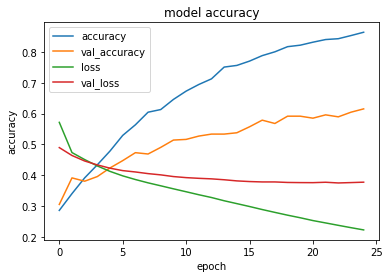

[test loss, test accuracy]: [0.6334521174430847, 0.23132529854774475]
f1
 >	unrelated : 0.33429394812680113	duplicate : 0.18181818181818182	both : 0.23841059602649006
	left : 0.10101010101010101	right : 0.0594059405940594
precission
 >	unrelated : 0.2196969696969697	duplicate : 0.24489795918367346	both : 0.2647058823529412
	left : 0.3125	right : 0.16666666666666666
recall
 >	unrelated : 0.6987951807228916	duplicate : 0.14457831325301204	both : 0.21686746987951808
	left : 0.060240963855421686	right : 0.03614457831325301

unrelated, duplicate, both, left, right
precission
[0.2197, 0.2449, 0.2647, 0.3125, 0.1667]
recall
[0.6988, 0.1446, 0.2169, 0.0602, 0.0361]
f1_scores
[0.3343, 0.1818, 0.2384, 0.101, 0.0594]
normalized f1:
0.18298


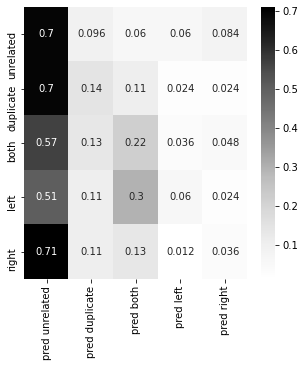

In [ ]:
output = model.predict(X_dev_test_list, batch_size=15)
output = list(map(numpy.argmax, output))

y_test_int = list(map(numpy.argmax, y_dev_test_list))
eval_result = model.evaluate(X_dev_test_list, y_dev_test_list, batch_size=15)

model.summary()

plt.subplots()
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(["accuracy", "val_accuracy", "loss", "val_loss"], loc='upper left')
plt.show()



plt.subplots(figsize=(5,5))
c_matrix = sklearn.metrics.confusion_matrix(y_true=y_test_int, y_pred=output, normalize="true")#, labels=)
import seaborn as sns
f = sns.heatmap(c_matrix,cmap=plt.cm.Greys, annot=True,xticklabels=["pred unrelated","pred duplicate","pred both","pred left","pred right"], yticklabels=["unrelated","duplicate","both","left","right"])


print("[test loss, test accuracy]:", eval_result)

f1_scores = sklearn.metrics.f1_score(y_true=y_test_int, y_pred=output, average=None)
precission = sklearn.metrics.precision_score(y_true=y_test_int, y_pred=output, average=None)
recall = sklearn.metrics.recall_score(y_true=y_test_int, y_pred=output, average=None)
all = sklearn.metrics.precision_recall_fscore_support(y_true=y_test_int, y_pred=output, average=None)

print(f"f1\n >\tunrelated : {f1_scores[0]}\tduplicate : {f1_scores[1]}\tboth : {f1_scores[2]}\n\tleft : {f1_scores[3]}\tright : {f1_scores[4]}")
print(f"precission\n >\tunrelated : {precission[0]}\tduplicate : {precission[1]}\tboth : {precission[2]}\n\tleft : {precission[3]}\tright : {precission[4]}")
print(f"recall\n >\tunrelated : {recall[0]}\tduplicate : {recall[1]}\tboth : {recall[2]}\n\tleft : {recall[3]}\tright : {recall[4]}")

print(f"\nunrelated, duplicate, both, left, right")
print("precission")
print(list(map(lambda x: round(x, 4), precission)))
print("recall")
print(list(map(lambda x: round(x, 4), recall)))
print("f1_scores")
f1 = list(map(lambda x: round(x, 4), f1_scores))
print(f1)
print("normalized f1:")
print(1/len(f1)*sum(f1))

In [ ]:
MODEL_NAME :str = "all_count"
model.save(MODEL_NAME)

!zip -r ./all_count.zip ./all_count

try:
  from google.colab import files
  files.download('all_count.zip')
except Exception:
  logger.error("An error occurred while downloading files")

  adding: all_count/ (stored 0%)
  adding: all_count/saved_model.pb (deflated 90%)
  adding: all_count/assets/ (stored 0%)
  adding: all_count/variables/ (stored 0%)
  adding: all_count/variables/variables.index (deflated 51%)
  adding: all_count/variables/variables.data-00000-of-00001 (deflated 39%)


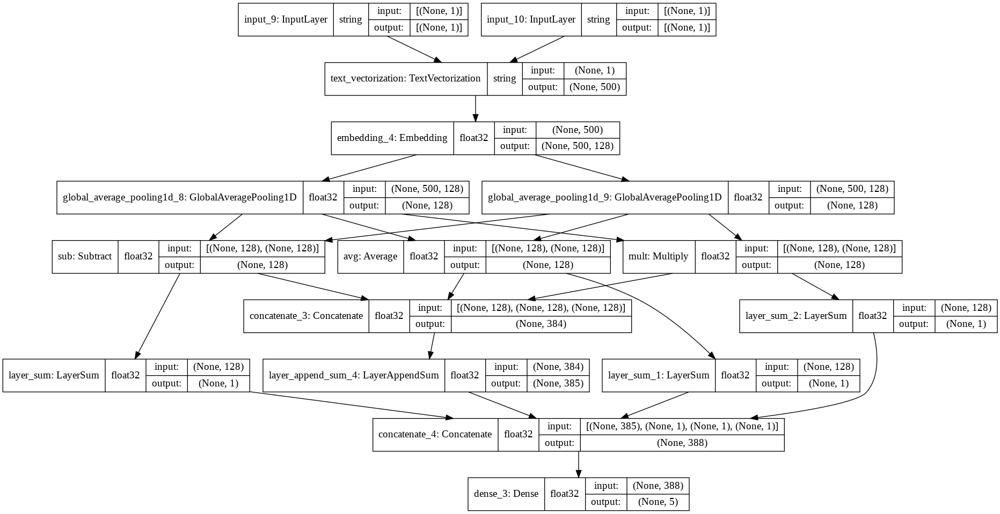

In [ ]:
tf.keras.utils.plot_model(
    model,
    to_file="Embed_baseline.png",
    show_shapes=True,
    show_dtype=True,
    show_layer_names=True,
    rankdir="TB",
    expand_nested=False,
    dpi=96,
)

#Siamese-Bert
Getting started with small Bert\
Note: BERT adds a "position embedding" to the token embedding of each input, and these come from a fixed-size lookup table. That imposes a max seq length of 512 (which is also a practical limit, due to the quadratic growth of attention computation). For this Colab 128 is good enough.

In [ ]:
!pip install -q tensorflow-text
!pip install -q tf-models-official
import os
import shutil

import tensorflow as tf
import tensorflow_hub as hub
import tensorflow_text as text
from official.nlp import optimization  # to create AdamW optmizer

import matplotlib.pyplot as plt

     |████████████████████████████████| 3.4MB 7.6MB/s 
     |████████████████████████████████| 1.1MB 9.0MB/s 
     |████████████████████████████████| 174kB 20.8MB/s 
     |████████████████████████████████| 706kB 29.5MB/s 
     |████████████████████████████████| 358kB 27.8MB/s 
     |███████████████████████████▍    | 32.2MB 1.5MB/s eta 0:00:04
ERROR: Operation cancelled by user


ModuleNotFoundError: ignored

In [ ]:
bert_preprocess_model = hub.KerasLayer("https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3")

text_test = ['this is such an amazing movie!']
text_preprocessed = bert_preprocess_model(text_test)

print(f'Keys       : {list(text_preprocessed.keys())}')
print(f'Shape      : {text_preprocessed["input_word_ids"].shape}')
print(f'Word Ids   : {text_preprocessed["input_word_ids"][0, :12]}')
print(f'Input Mask : {text_preprocessed["input_mask"][0, :12]}')
print(f'Type Ids   : {text_preprocessed["input_type_ids"][0, :12]}')


INFO:absl:Using /tmp/tfhub_modules to cache modules.
INFO:absl:Downloading TF-Hub Module 'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3'.
INFO:absl:Downloaded https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3, Total size: 1.96MB
INFO:absl:Downloaded TF-Hub Module 'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3'.


Keys       : ['input_word_ids', 'input_mask', 'input_type_ids']
Shape      : (1, 128)
Word Ids   : [ 101 2023 2003 2107 2019 6429 3185  999  102    0    0    0]
Input Mask : [1 1 1 1 1 1 1 1 1 0 0 0]
Type Ids   : [0 0 0 0 0 0 0 0 0 0 0 0]


In [ ]:
def createModelBert(hp):
  inputs_l = keras.Input(shape=(), dtype="string", name='text_left')
  inputs_r = keras.Input(shape=(), dtype="string", name='text_right')

  preprocessing_layer = hub.KerasLayer("https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3", name='BERT_preprocessing')
  encoder_left_inputs = preprocessing_layer(inputs_l)
  encoder_right_inputs = preprocessing_layer(inputs_r)
  encoder = hub.KerasLayer("https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-4_H-512_A-8/1", trainable=True, name='BERT_encoder')
  left_encoder = encoder(encoder_left_inputs)
  right_encoder = encoder(encoder_right_inputs)
  a = left_encoder['pooled_output']
  b = right_encoder['pooled_output']
  avg_layer = tf.keras.layers.Average()([a, b])
  mult_layer = tf.keras.layers.Multiply()([a,b])
  sub_layer = keras.layers.Subtract()([a, b])

  hidden = tf.keras.layers.concatenate([sub_layer, avg_layer, mult_layer], name="merging_layer")
  for i in range(hp.Int("n_layers", 0,4)):
  # Tune the number of units in the first Dense layer
  # Choose an optimal value between 32-512
    hp_units = hp.Int(f"dense_{i}_units", min_value=0, max_value=512, step=32)
    hidden = keras.layers.Dense(units=hp_units, activation='relu')(hidden)

  #dropout = tf.keras.layers.Dropout(0.3)(hidden)
  outputs = layers.Dense(4, activation='relu', name="outputs")(hidden)

  model = keras.Model([inputs_l,inputs_r], outputs)
  # Tune the learning rate for the optimizer
  # Choose an optimal value from 0.01, 0.001, or 0.0001
  #hp_learning_rate = hp.Choice('learning_rate', values=[1e-2, 1e-3, 1e-4])
  model.compile(optimizer="adam", loss="binary_crossentropy", metrics=['accuracy'])
  return model

#model = createModelBert()
#tf.keras.utils.plot_model(model, show_dtype=True, show_layer_names=True, show_shapes=True)

In [ ]:
tuner = kt.Hyperband(createModelBert,
                     objective='val_accuracy',
                     max_epochs=10,
                     factor=1,
                     directory='my_dir',
                     project_name='baseline2')
stop_early = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5)

tuner.search(x=X_train_list, y=Y, batch_size = 30, epochs=7, validation_split=0.2, callbacks=[stop_early])

Trial 30 Complete [00h 33m 45s]
val_accuracy: 0.27983540296554565

Best val_accuracy So Far: 0.27983540296554565
Total elapsed time: 09h 46m 12s


In [ ]:
hypermodel = tuner.hypermodel.build(best_hps)

# Retrain the model
history = hypermodel.fit(x=X_train_list, y=Y, batch_size = 400, epochs=15, validation_split=0.2)
eval_result = hypermodel.evaluate(X_test_list, Y_test)
hypermodel.summary()

NameError: ignored

In [ ]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(["accuracy", "val_accuracy", "loss", "val_loss"], loc='upper left')
plt.show()

In [ ]:
history = model.fit(x=X_train_list, y=Y, batch_size = 32, epochs=15, validation_split=0.2)
eval_result = model.evaluate(X_test_list, Y_test)
print("[test loss, test accuracy]:", eval_result)

Epoch 1/15
38/38 [==============================] - 614s 16s/step - loss: 6.7621 - accuracy: 0.2045 - val_loss: 6.7227 - val_accuracy: 0.1875
Epoch 2/15
38/38 [==============================] - 589s 16s/step - loss: 6.7621 - accuracy: 0.2045 - val_loss: 6.7227 - val_accuracy: 0.1875
Epoch 3/15
38/38 [==============================] - 634s 17s/step - loss: 6.7621 - accuracy: 0.2045 - val_loss: 6.7227 - val_accuracy: 0.1875
Epoch 4/15
38/38 [==============================] - 676s 18s/step - loss: 6.7621 - accuracy: 0.2045 - val_loss: 6.7227 - val_accuracy: 0.1875
Epoch 5/15
38/38 [==============================] - 641s 17s/step - loss: 6.7621 - accuracy: 0.2045 - val_loss: 6.7227 - val_accuracy: 0.1875
Epoch 6/15
38/38 [==============================] - 622s 16s/step - loss: 6.7621 - accuracy: 0.2045 - val_loss: 6.7227 - val_accuracy: 0.1875
Epoch 7/15
38/38 [==============================] - 638s 17s/step - loss: 6.7621 - accuracy: 0.2045 - val_loss: 6.7227 - val_accuracy: 0.1875
Epoch 

NameError: ignored

In [ ]:
legends = []
plt.figure(figsize=(10, 7))
model_data = history.history
plt.plot(model_data['accuracy'])
plt.plot(model_data['val_accuracy'])
legends.append("Bert_accuracy")
legends.append("Bert_val_accuracy")
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(legends, loc='upper left')
plt.show()

NameError: ignored

#Bert

In [ ]:
!pip install transformers==2.11.0
import transformers #huggingface transformers
from tokenizers import BertWordPieceTokenizer
from transformers import BertTokenizer, TFBertModel, BertConfig
import tensorflow as tf

     |████████████████████████████████| 675kB 8.0MB/s 
     |████████████████████████████████| 901kB 15.6MB/s 
     |████████████████████████████████| 5.6MB 32.9MB/s 
     |████████████████████████████████| 1.2MB 49.0MB/s 


In [ ]:
max_length = 128  # Maximum length of input sentence to the model.
batch_size = 32
epochs = 10

class BertSemanticDataGenerator(tf.keras.utils.Sequence):
    """Generates batches of data.

    Args:
        sentence_pairs: Array of premise and hypothesis input sentences.
        labels: Array of labels.
        batch_size: Integer batch size.
        shuffle: boolean, whether to shuffle the data.
        include_targets: boolean, whether to incude the labels.

    Returns:
        Tuples `([input_ids, attention_mask, `token_type_ids], labels)`
        (or just `[input_ids, attention_mask, `token_type_ids]`
         if `include_targets=False`)
    """

    def __init__(
        self,
        sentence_pairs,
        labels,
        batch_size=batch_size,
        shuffle=True,
        include_targets=True,
    ):
        self.sentence_pairs = sentence_pairs
        self.labels = labels
        self.shuffle = shuffle
        self.batch_size = batch_size
        self.include_targets = include_targets
        # Load our BERT Tokenizer to encode the text.
        # We will use base-base-uncased pretrained model.
        self.tokenizer = transformers.BertTokenizer.from_pretrained(
            "bert-base-uncased", do_lower_case=True
        )
        self.indexes = numpy.arange(len(self.sentence_pairs))
        self.on_epoch_end()

    def __len__(self):
        # Denotes the number of batches per epoch.
        return len(self.sentence_pairs) // self.batch_size

    def __getitem__(self, idx):
        # Retrieves the batch of index.
        indexes = self.indexes[idx * self.batch_size : (idx + 1) * self.batch_size]
        sentence_pairs = self.sentence_pairs[indexes]

        # With BERT tokenizer's batch_encode_plus batch of both the sentences are
        # encoded together and separated by [SEP] token.
        encoded = self.tokenizer.batch_encode_plus(
            sentence_pairs.tolist(),
            add_special_tokens=True,
            max_length=max_length,
            return_attention_mask=True,
            return_token_type_ids=True,
            pad_to_max_length=True,
            return_tensors="tf",
        )

        # Convert batch of encoded features to numpy array.
        input_ids = numpy.array(encoded["input_ids"], dtype="int32")
        attention_masks = numpy.array(encoded["attention_mask"], dtype="int32")
        token_type_ids = numpy.array(encoded["token_type_ids"], dtype="int32")

        # Set to true if data generator is used for training/validation.
        if self.include_targets:
            labels = numpy.array(self.labels[indexes], dtype="int32")
            return [input_ids, attention_masks, token_type_ids], labels
        else:
            return [input_ids, attention_masks, token_type_ids]

    def on_epoch_end(self):
        # Shuffle indexes after each epoch if shuffle is set to True.
        if self.shuffle:
            numpy.random.RandomState(42).shuffle(self.indexes)



Strategy: <tensorflow.python.distribute.mirrored_strategy.MirroredStrategy object at 0x7fa29b115690>
Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_ids (InputLayer)          [(None, 128)]        0                                            
__________________________________________________________________________________________________
attention_masks (InputLayer)    [(None, 128)]        0                                            
__________________________________________________________________________________________________
token_type_ids (InputLayer)     [(None, 128)]        0                                            
__________________________________________________________________________________________________
tf_bert_model (TFBertModel)     ((None, 128, 768), ( 109482240   input_ids[0][0]           

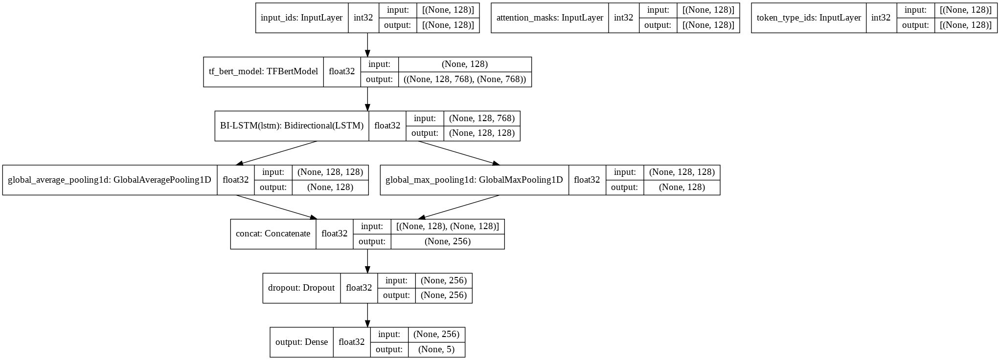

In [ ]:
# Create the model under a distribution strategy scope.
strategy = tf.distribute.MirroredStrategy()

with strategy.scope():
    # Encoded token ids from BERT tokenizer.
    input_ids = tf.keras.layers.Input(
        shape=(max_length,), dtype=tf.int32, name="input_ids"
    )
    # Attention masks indicates to the model which tokens should be attended to.
    attention_masks = tf.keras.layers.Input(
        shape=(max_length,), dtype=tf.int32, name="attention_masks"
    )
    # Token type ids are binary masks identifying different sequences in the model.
    token_type_ids = tf.keras.layers.Input(
        shape=(max_length,), dtype=tf.int32, name="token_type_ids"
    )
    # Loading pretrained BERT model.
    bert_model = transformers.TFBertModel.from_pretrained("bert-base-uncased")
    # Freeze the BERT model to reuse the pretrained features without modifying them.
    bert_model.trainable = False

    sequence_output, pooled_output = bert_model(
        input_ids, attention_mask=attention_masks, token_type_ids=token_type_ids
    )
    # Add trainable layers on top of frozen layers to adapt the pretrained features on the new data.
    bi_lstm = tf.keras.layers.Bidirectional(
        tf.keras.layers.LSTM(64, return_sequences=True), name="BI-LSTM"
        )(sequence_output)
    # Applying hybrid pooling approach to bi_lstm sequence output.
    avg_pool = tf.keras.layers.GlobalAveragePooling1D()(bi_lstm)
    max_pool = tf.keras.layers.GlobalMaxPooling1D()(bi_lstm)
    concat = tf.keras.layers.concatenate([avg_pool, max_pool], name="concat")
    dropout = tf.keras.layers.Dropout(0.3, name="dropout")(concat)
    output = tf.keras.layers.Dense(5, activation="softmax", name="output")(dropout)
    model = tf.keras.models.Model(
        inputs=[input_ids, attention_masks, token_type_ids], outputs=output
    )

    model.compile(
        optimizer="adam",
        loss="categorical_crossentropy",
        metrics=["acc"],
    )


print(f"Strategy: {strategy}")
model.summary()
tf.keras.utils.plot_model(
    model,
    to_file="Bert.png",
    show_shapes=True,
    show_dtype=True,
    show_layer_names=True,
    rankdir="TB",
    expand_nested=False,
    dpi=96,
)



In [ ]:
train_data = BertSemanticDataGenerator(
    X_train,
    Y,
    batch_size=batch_size,
    shuffle=False,
)
valid_data = BertSemanticDataGenerator(
    X_test,
    Y_test,
    batch_size=batch_size,
    shuffle=False,
)


In [ ]:
history = model.fit(
    train_data,
    validation_data=valid_data,
    epochs=epochs,
    use_multiprocessing=True,
    workers=-1,
)

Epoch 1/10
57/58 [============================>.] - ETA: 18s - loss: 1.5632 - acc: 0.2933

KeyboardInterrupt: ignored

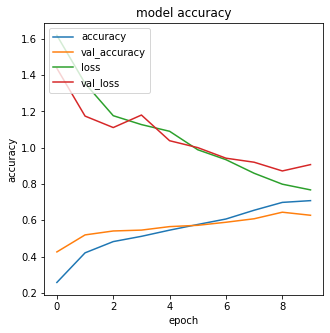

In [ ]:
gc.collect()

plt.subplots(figsize=(5,5))
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(["accuracy", "val_accuracy", "loss", "val_loss"], loc='upper left')
plt.show()

y_test_int = numpy.array(list(map(lambda x:numpy.array(x).argmax(),y_dev_test_list)))
test_data = BertSemanticDataGenerator(
    test_dev,
    labels = None,
    batch_size=batch_size,
    shuffle=False,
    include_targets=False
)


[[2.4945228e-03 2.4523956e-01 2.8050831e-01 2.8736821e-01 1.8438943e-01]
 [1.6219713e-03 2.8997529e-01 3.5707301e-01 1.7604479e-01 1.7528491e-01]
 [5.3388346e-03 3.3838221e-01 1.3439167e-01 3.4697121e-01 1.7491604e-01]
 ...
 [9.9717951e-01 3.2492992e-04 1.2828072e-03 7.3696341e-04 4.7585904e-04]
 [2.2378832e-03 4.0118983e-01 1.8527836e-01 1.1956986e-01 2.9172409e-01]
 [4.5509110e-03 8.4880042e-01 5.2565765e-02 4.6097111e-02 4.7985792e-02]]
(480, 5)
[0.0024663  0.58922863 0.07741952 0.14808273 0.18280275]


ValueError: ignored

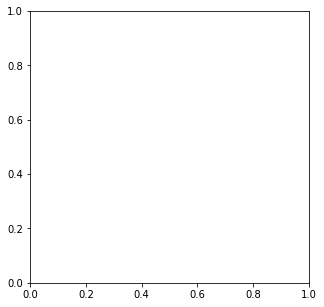

In [ ]:
predicted_output = model.predict(test_data)
print(predicted_output)

print(predicted_output.shape)
tmp = numpy.array(list(map(lambda x: x.argmax(),predicted_output)))
#print(y_test_int)

In [ ]:
model.save('my_BERT')

In [ ]:
!zip -r my_BERT.zip my_BERT

In [ ]:
try:
  
  from google.colab import files
  files.download('my_BERT.zip')
except Exception:
  print(Exception)

In [ ]:
!unzip my_BERT.zip -d my_BERT

In [ ]:
reconstructed_model_1 = keras.models.load_model("my_BERT.h5")
#reconstructed_model_2 = keras.models.load_model("my_BERT")

# Let's check:
#numpy.testing.assert_allclose(
#    model.predict(test_input), reconstructed_model.predict(test_input)
#)

In [ ]:
reconstructed_model_1.predict()

#Unfreeze BERT

In [ ]:
#load model
model = keras.models.load_model('path/to/location')

In [ ]:
# Unfreeze the bert_model.
bert_model.trainable = True
# Recompile the model to make the change effective.
model.compile(
    optimizer=tf.keras.optimizers.Adam(1e-5),
    loss="categorical_crossentropy",
    metrics=["accuracy"],
)
model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_ids (InputLayer)          [(None, 128)]        0                                            
__________________________________________________________________________________________________
attention_masks (InputLayer)    [(None, 128)]        0                                            
__________________________________________________________________________________________________
token_type_ids (InputLayer)     [(None, 128)]        0                                            
__________________________________________________________________________________________________
tf_bert_model (TFBertModel)     ((None, 128, 768), ( 109482240   input_ids[0][0]                  
                                                                 attention_masks[0][0]        

In [ ]:
history = model.fit(
    train_data,
    validation_data=valid_data,
    epochs=epochs,
    use_multiprocessing=True,
    workers=-1,
)

Epoch 1/10
37/37 [==============================] - 339s 9s/step - loss: 0.3643 - accuracy: 0.8996 - val_loss: 0.4503 - val_accuracy: 0.8472
Epoch 2/10
37/37 [==============================] - 291s 8s/step - loss: 0.3002 - accuracy: 0.9076 - val_loss: 0.3825 - val_accuracy: 0.8594
Epoch 3/10
37/37 [==============================] - 290s 8s/step - loss: 0.2222 - accuracy: 0.9373 - val_loss: 0.3763 - val_accuracy: 0.8785
Epoch 4/10
37/37 [==============================] - 291s 8s/step - loss: 0.1740 - accuracy: 0.9674 - val_loss: 0.3615 - val_accuracy: 0.8663
Epoch 5/10
37/37 [==============================] - 290s 8s/step - loss: 0.1689 - accuracy: 0.9485 - val_loss: 0.3387 - val_accuracy: 0.8889
Epoch 6/10
37/37 [==============================] - 290s 8s/step - loss: 0.1396 - accuracy: 0.9769 - val_loss: 0.3334 - val_accuracy: 0.8854
Epoch 7/10
37/37 [==============================] - 295s 8s/step - loss: 0.1358 - accuracy: 0.9704 - val_loss: 0.3191 - val_accuracy: 0.8681
Epoch 8/10
37

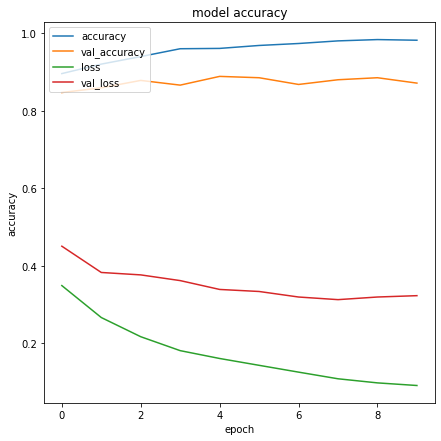

In [ ]:
plt.subplots(figsize=(7,7))
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(["accuracy", "val_accuracy", "loss", "val_loss"], loc='upper left')
plt.show()

#Lime

In [ ]:
!pip install lime
from lime import lime_text
from lime.lime_text import LimeTextExplainer
class_names:List[str] = ["unrelated","duplicate","both","left","right"]
explainer = LimeTextExplainer(split_expression=u'(\W|空)+',class_names=class_names)

def split_list_using_seperator(s:str)-> numpy.ndarray:
  global separator
  splitted = s.split(separator)
  splitted = numpy.array(list(filter(lambda d: not d == "", splitted)))
  return splitted

def predict_concat_input(inp:List[str])-> numpy.ndarray:
  global model
  tmp = list(map(split_list_using_seperator, inp))
  inputs:numpy.ndarray = numpy.array(tmp)
  return model.predict([inputs[:,0], inputs[:,1]])#(batchVectorisation(inputs, vectoriser))#

def concat_inputs(inputs):
  global separator
  return separator.join(inputs)

separator:str = "空"
def string_to_array(string):
  return numpy.array([string])

def list_creator(array):
  return [string_to_array(array[0]), string_to_array(array[1])]#[vectoriser(string_to_array(array[0])), vectoriser(string_to_array(array[1]))]

In [ ]:
IMP_NUMBERS:List[int] = [[19,32], [34,48], [13,27], [22,30], [24,43]]
del X_train_list, X_test_list


def experimentForIdx(idx):
  global test_dev, model, explainer, class_names, y_dev_test_list
  model_input = concat_inputs(test_dev[idx,:])
  exp = explainer.explain_instance(model_input, predict_concat_input, num_samples=2500, num_features=10,labels=[0,1,2,3,4])
  gc.collect()
  print(f"True class: {class_names[y_dev_test_list[idx].argmax()]}")
  return exp

for cl in range(len(IMP_NUMBERS)):
  for i in range(len(IMP_NUMBERS[cl])):
    idx = IMP_NUMBERS[cl][i]
    exp = experimentForIdx(idx)
    exp.show_in_notebook(text=concat_inputs(test_dev[idx,:]), labels=(0,1,2,3,4))
    gc.collect()


True class: left


True class: left


True class: unrelated


True class: duplicate


True class: left


True class: unrelated


True class: both


True class: both


True class: both


True class: both


In [ ]:
#tf-idf 100000 1-2gram
models = numpy.array(["concat", "concat cosine", "all sum", "all sum sum"])
f1_scores = numpy.array([
                         [0.3942, 0.2262, 0.1344, 0.3309, 0.3161],
                         [0.4693, 0.3197, 0.1908, 0.3322, 0.3302],
                         [0.3947, 0.2374, 0.1447, 0.3988, 0.3432],
                         [0.4954, 0.2756, 0.1969, 0.406, 0.4333]
])
precission =  numpy.array([
                         [0.2791, 0.4167, 0.1848, 0.3932, 0.3289],
                         [0.3558, 0.4699, 0.2213, 0.3657, 0.3377],
                         [0.283, 0.4483, 0.2297, 0.4, 0.3662],
                         [0.3927, 0.4844, 0.2688, 0.3908, 0.392]
])
recall = numpy.array([
                      [0.6708, 0.1553, 0.1056, 0.2857, 0.3043],
                      [0.6894, 0.2422, 0.1677, 0.3043, 0.323],
                      [0.6522, 0.1615, 0.1056, 0.3975, 0.323],
                      [0.6708, 0.1925, 0.1553, 0.4224, 0.4845]
])

In [ ]:
#tf-idf
models = numpy.array(["all", "all cos", "all cos + l2","all sum", "all sum sum"])
f1_scores = numpy.array([
             [0.4511, 0.2044, 0.0676, 0.3314, 0.3846],
             [0.5207, 0.3059, 0.0995, 0.3402, 0.3955],
             [0.7218, 0.342, 0.094, 0.3796, 0.4056],
             [0.4421, 0.2165, 0.0788, 0.361, 0.3823],
             [0.5784, 0.3142, 0.1043, 0.4252, 0.4755]
])
precission =  numpy.array([
                      [0.343, 0.3594, 0.1522, 0.3115, 0.3448],
                      [0.4139, 0.4149, 0.1833, 0.3222, 0.3586],
                      [0.605, 0.4259, 0.1507, 0.349, 0.3711],
                      [0.3377, 0.3571, 0.1905, 0.3351, 0.345],
                      [0.512, 0.41, 0.22, 0.3682, 0.4071],
])
recall = numpy.array([
                      [0.6584, 0.1429, 0.0435, 0.354, 0.4348],
                      [0.7019, 0.2422, 0.0683, 0.3602, 0.441],
                      [0.8944, 0.2857, 0.0683, 0.4161, 0.4472],
                      [0.6398, 0.1553, 0.0497, 0.3913, 0.4286],
                      [0.6646, 0.2547, 0.0683, 0.5031, 0.5714]
])

In [ ]:
#normal
models = numpy.array(["baseline", "average", "mult","concat", "sub-mult", "CosConcat", "L2CosConcat", "iCosConcat", "L2Subtract", "logCosConcat", "uniCosConcat",
                      "sub-sum","mult-sum", "concat-sum", "sumSubMult", "sumCosConcat", "sumL2CosConcat", "sumICosConcat", "sumUniCosConcat","sumL2Concat",
                      "cosConcatSum", "dblSumConcat"])
f1_scores = numpy.array([
                         [0.3071, 0.2375, 0.2316, 0.2967, 0.3529],
              [0.4254, 0.1613, 0.2462, 0.2209, 0.2086],
              [0.7378, 0.3657, 0.2268, 0.2723, 0.2286],
              [0.6609, 0.2893, 0.1628, 0.4694, 0.51],
              [0.6396, 0.2805, 0.2433, 0.275, 0.3576],
              [0.5051, 0.2807, 0.2625, 0.3887, 0.3659],
              [0.6547, 0.2406, 0.094, 0.6316, 0.5991],
              [0.5799, 0.2811, 0.1761, 0.452, 0.4824],
              [0.3221, 0.2029, 0.1504, 0.5461, 0.5353],
              [0.6295, 0.4052, 0.2754, 0.2078, 0.0635],
              [0.6667, 0.3333, 0.1872, 0.4242, 0.4751],
              [0.2198, 0.2737, 0.1921, 0.4741, 0.1676], #sum
              [0.7289, 0.3102, 0.2459, 0.1168, 0.2515],
              [0.6224, 0.3041, 0.215, 0.4835, 0.2895],
              [0.6027, 0.2609, 0.2172, 0.3333, 0.3234],
              [0.6299, 0.2485, 0.1925, 0.4756, 0.4946],
              [0.6545, 0.237, 0.0952, 0.6344, 0.5974],
              [0.5923, 0.3077, 0.2201, 0.3924, 0.4024],
              [0.4615, 0.2105, 0.1358, 0.5112, 0.5192],
              [0.2857, 0.2105, 0.1085, 0.5575, 0.5396],
              [0.6502, 0.2945, 0.1929, 0.4725, 0.5029],
              [0.6172, 0.2796, 0.1436, 0.4624, 0.3576]
])
precission =  numpy.array([
  [0.2552, 0.2969, 0.234, 0.314, 0.3626],
         [0.3059, 0.3571, 0.2424, 0.2687, 0.2537],
         [0.6434, 0.4051, 0.2245, 0.2737, 0.2532],
         [0.562, 0.3651, 0.1842, 0.46, 0.4904],
         [0.5635, 0.3382, 0.1916, 0.3438, 0.4909],  
         [0.3773, 0.4776, 0.2642, 0.5581, 0.3593],
         [0.5748, 0.4324, 0.1321, 0.5455, 0.5191],
         [0.4509, 0.2921, 0.2222, 0.4938, 0.5541],
         [0.4528, 0.3333, 0.2703, 0.4229, 0.4162],
         [0.5097, 0.5439, 0.2111, 0.2759, 0.1333],
         [0.5603, 0.3718, 0.1776, 0.5072, 0.5059],
         [0.2326, 0.2766, 0.2099, 0.4044, 0.1807],
         [0.6357, 0.3187, 0.2027, 0.1951, 0.2958],
         [0.5172, 0.3467, 0.1949, 0.5116, 0.3929],
         [0.5366, 0.3231, 0.192, 0.3333, 0.3803],
         [0.5063, 0.2877, 0.1978, 0.5735, 0.5111],
         [0.5806, 0.4103, 0.1373, 0.5496, 0.5111],
         [0.4695, 0.3562, 0.2035, 0.5, 0.4853],
         [0.3913, 0.3784, 0.1667, 0.4488, 0.4821],
         [0.5135, 0.3784, 0.2121, 0.4188, 0.4121],
         [0.5374, 0.3582, 0.1881, 0.5, 0.557],
         [0.4938, 0.2889, 0.1529, 0.4778, 0.4909]
])
recall = numpy.array([
                [0.3854, 0.1979, 0.2292, 0.2812, 0.3438],
                 [0.6979, 0.1042, 0.25, 0.1875, 0.1771],
                 [0.8646, 0.3333, 0.2292, 0.2708, 0.2083],
                 [0.8021, 0.2396, 0.1458, 0.4792, 0.5312],
                 [0.7396, 0.2396, 0.3333, 0.2292, 0.2812],
                 [0.764, 0.1988, 0.2609, 0.2981, 0.3727],
                 [0.7604, 0.1667, 0.0729, 0.75, 0.7083],
                 [0.8125, 0.2708, 0.1458, 0.4167, 0.4271],
                 [0.25, 0.1458, 0.1042, 0.7708, 0.75],
                 [0.8229, 0.3229, 0.3958, 0.1667, 0.0417],
                 [0.8229, 0.3021, 0.1979, 0.3646, 0.4479],
                 [0.2083, 0.2708, 0.1771, 0.5729, 0.1562],
                 [0.8542, 0.3021, 0.3125, 0.0833, 0.2188],
                 [0.7812, 0.2708, 0.2396, 0.4583, 0.2292],
                 [0.6875, 0.2188, 0.25, 0.3333, 0.2812],
                 [0.8333, 0.2188, 0.1875, 0.4062, 0.4792],
                 [0.75, 0.1667, 0.0729, 0.75, 0.7188],
                 [0.8021, 0.2708, 0.2396, 0.3229, 0.3438],
                 [0.5625, 0.1458, 0.1146, 0.5938, 0.5625],
                 [0.1979, 0.1458, 0.0729, 0.8333, 0.7812],
                 [0.8229, 0.25, 0.1979, 0.4479, 0.4583],
                 [0.8229, 0.2708, 0.1354, 0.4479, 0.2812]
])

In [ ]:
#1-2gram
models = numpy.array(["avg", "mult", "baseline", "all", "all sum", "all sum sum", "avg sum", "mult sum", "sub sum"])
f1_scores = numpy.array([
             [0.3587,0.1397,0.2857, 0.1964, 0.0231],
             [0.3475, 0.2574, 0.0534, 0.2787, 0.0],
             [0.283, 0.189, 0.2197, 0.1842, 0.4584],
             [0.4016, 0.1758, 0.1843, 0.2443, 0.4954],
             [0.0523, 0.1229, 0.0, 0.3473, 0.0685],
             [0, 0.0222, 0.2322, 0.086, 0.5635],
             [0.3495, 0.1034, 0.2247, 0.0518, 0.0228],
             [0.0462, 0, 0.2881, 0.256, 0.0],
             [0.2307, 0.1878, 0.1619, 0.354, 0.517]
])
precission =  numpy.array([
                           [0.2409,0.52,0.2742, 0.2258, 0.1666],
                           [0.368, 0.1889, 0.1923, 0.2164, 0.0],
                           [0.2866, 0.228, 0.197, 0.1958, 0.4255],
                           [0.3028, 0.7619, 0.2045, 0.45, 0.3927],
                           [0.1666, 0.6111, 0.0, 0.2113, 0.4285],
                           [0, 0.1052, 0.1662, 0.32, 0.3281],
                           [0.2187, 0.6923, 0.2803, 0.1562, 0.1428],
                           [0.3333, 0, 0.187, 0.2094, 0],
                           [0.264, 0.1691, 0.2325, 0.375, 0.4257]
])
recall = numpy.array([
                      [0.7018, 0.0807, 0.2981, 0.1739, 0.0124],
                      [0.3291, 0.4037, 0.031, 0.3913, 0],
                      [0.2795, 0.1614, 0.2484, 0.1739, 0.4968],
                      [0.5962, 0.0993, 0.1677, 0.1677, 0.6708],
                      [0.031, 0.0683, 0.0, 9751, 0.0372],
                      [0, 0.0124, 0.385, 0.0496, 0.7888],
                      [0.8695, 0.0559, 0.1863, 0.031, 0.0124],
                      [0.0248, 0, 0.6273, 0.3291, 0.0],
                      [0.2049, 0.2111, 0.1242, 0.3354, 0.6583]
])

In [ ]:
models = numpy.array(["concat"])
f1_scores = numpy.array([
             [0.5663, 0.1687, 0.0602, 0.5181, 0.5663]
])
precission =  numpy.array([
                      [0.2866, 0.28, 0.1429, 0.5443, 0.5402]
])
recall = numpy.array([
                      [0.3806, 0.2105, 0.0847, 0.5309, 0.5529]
])

In [ ]:
#tf-idf   '=>', '<=', '<=>', 'unrelated', 'duplicate', 
labels = numpy.array(['unrelated', 'duplicate', '<=>', '<=', '=>'])
rearrange = numpy.array([4,3,2,0,1])
labels = labels[rearrange]
f1_scores = f1_scores[:,rearrange]
precission = precission[:, rearrange]
recall = recall[:, rearrange]
print(models)
print(f1_scores)
print("prec recall tabelle\t"+ "\t\t".join(labels))
for i in range(len(models)):
  output = models[i] + "\t\t"
  for j in range(len(labels)):
    output += f"& {precission[i][j]} & {recall[i][j]}"
  print(output + "\\\\")

['baseline' 'average' 'mult' 'concat' 'sub-mult' 'CosConcat' 'L2CosConcat'
 'iCosConcat' 'L2Subtract' 'logCosConcat' 'uniCosConcat' 'sub-sum'
 'mult-sum' 'concat-sum' 'sumSubMult' 'sumCosConcat' 'sumL2CosConcat'
 'sumICosConcat' 'sumUniCosConcat' 'sumL2Concat' 'cosConcatSum'
 'dblSumConcat']
[[0.3529 0.2967 0.2316 0.3071 0.2375]
 [0.2086 0.2209 0.2462 0.4254 0.1613]
 [0.2286 0.2723 0.2268 0.7378 0.3657]
 [0.51   0.4694 0.1628 0.6609 0.2893]
 [0.3576 0.275  0.2433 0.6396 0.2805]
 [0.3659 0.3887 0.2625 0.5051 0.2807]
 [0.5991 0.6316 0.094  0.6547 0.2406]
 [0.4824 0.452  0.1761 0.5799 0.2811]
 [0.5353 0.5461 0.1504 0.3221 0.2029]
 [0.0635 0.2078 0.2754 0.6295 0.4052]
 [0.4751 0.4242 0.1872 0.6667 0.3333]
 [0.1676 0.4741 0.1921 0.2198 0.2737]
 [0.2515 0.1168 0.2459 0.7289 0.3102]
 [0.2895 0.4835 0.215  0.6224 0.3041]
 [0.3234 0.3333 0.2172 0.6027 0.2609]
 [0.4946 0.4756 0.1925 0.6299 0.2485]
 [0.5974 0.6344 0.0952 0.6545 0.237 ]
 [0.4024 0.3924 0.2201 0.5923 0.3077]
 [0.5192 0.5112 0.1358 

In [ ]:
mod = [(11,0), (12,2), (13,3), (14,4), (15,5), (16,6), (17,7), (18,10), ]
for sum,normal in mod:
  print(f"{models[sum]} : {models[normal]}")
  print()


sub-sum : baseline
mult-sum : mult
concat-sum : concat
sumSubMult : sub-mult
sumCosConcat : CosConcat
sumL2CosConcat : L2CosConcat
sumICosConcat : iCosConcat
sumUniCosConcat : uniCosConcat


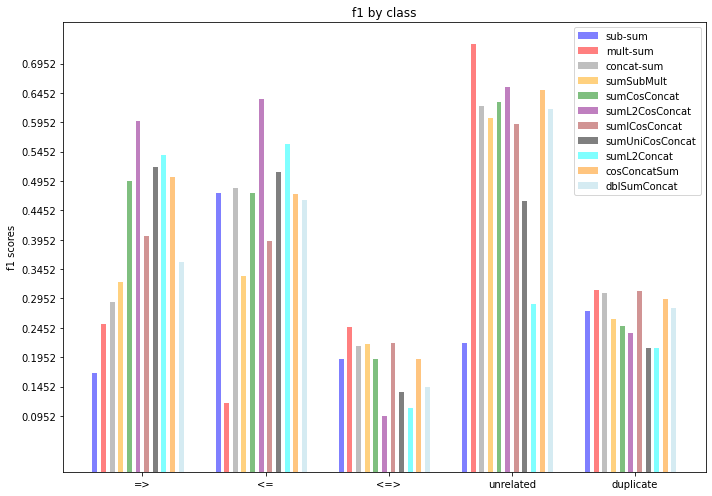

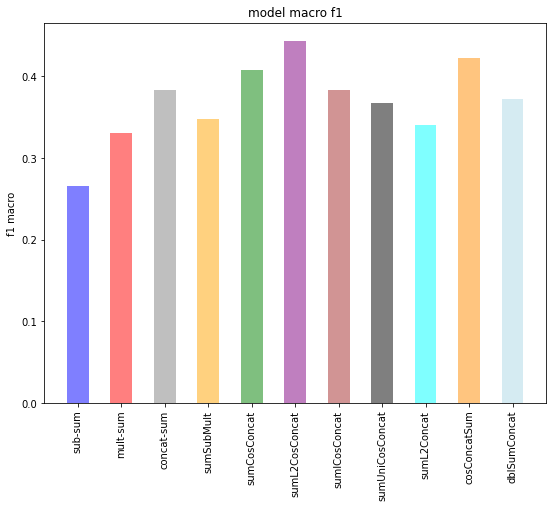

In [ ]:
#labels = ['=>', '<=', '<=>', 'unrelated', 'duplicate']
#models = numpy.array(["average", "multiplication", "baseline", "concat.", "sub-mult", 'CosConcat', 'L2CosConcat', 'uvCosConcat', "L2Subtract", "logCosConcat"])#, "baseline sum avg", "baseline sum mult", "baseline sum sub", "baseline sum", "baseline sum sum","baseline_cos_sum", "all_l2_cos"])
#f1_scores = [[0.1027289189,	0.1506117372,	0.1123073316,	0.3467901601,	0.1276076315],
#          [0.2694585232,	0.0453787234,	0.2112744322,	0.3854982506,	0.2342819444],
#          [0.2786108596,	0.3239465967,	0.1649468599,	0.1622632226,	0.1922534684],
#          [0.3941395554,	0.143250458,	0.171769554,	0.453555634,	0.2451779499],
#          [0.2527259175,	0.372824714,	0.06081962709,	0.453323779,	0.312732056],
#          [0.3887, 0.3659, 0.2625, 0.2807, 0.5051],
#          [0.6316, 0.5991, 0.094,  0.2406, 0.6547],
#          [0.452,  0.4824, 0.1761, 0.2811, 0.5799],
#          [0.5461, 0.5353, 0.1504, 0.2029, 0.3221],
#          [0.0635, 0.2078, 0.2754, 0.6295, 0.4052]
#          [0.01140927835,	0.06113211889,	0.3046452561,	0.342109379,	0.08407916411],
#          [0.276984835,	0,	0.2174756076,	0.5034676424,	0.3241059738],
#          [0.2610856269,	0.4953001042,	0.1864666845,	0.1762017167,	0.1538219566],
#          [0.1794403828,	0.4583053801,	0.2001802171,	0.4697525706,	0.2648139979],
#          [0.4126472084,	0.2794033174,	0.1824299844,	0.4743639479,	0.3183940678],
#          [0.3139, 0.14, 0.2058, 0.448, 0.2791],
#          [0.2283, 0.2054, 0.0667, 0.3558, 0.0698]
#]

#f1_scores = f1_scores[:6]
number = 11
models = models[number:]
precission = precission[number:]
recall = recall[number:]
f1_scores = f1_scores[number:]

color=["blue", 'red', 'gray', 'orange', 'green', 'purple', 'brown', 'black', 'cyan', 'darkorange', "lightblue"]

global_minimum = min(list(map(lambda x: min(x), f1_scores)))
global_maximum = max(list(map(lambda x: max(x), f1_scores)))

f1_mactro = numpy.array(list(map(sum, f1_scores)))/len(labels) #numpy.array(list(map(lambda x: sum(x),f1_scores)))
x = numpy.arange(len(labels))  # the label locations
width = 0.07  # the width of the bars
space = 0.03

fig, ax = plt.subplots(figsize=(10,7),)
for i in range(len(models)):
  offset_left:float = -len(models)*width/2 + width*i
  ax.bar(x + offset_left, f1_scores[i], label=models[i], width=width-space, alpha=0.5, color=color[i])

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('f1 scores')
ax.set_title('f1 by class')
ax.set_xticks(x)
ax.set_xticklabels(labels)
ax.set_yticks(numpy.arange(global_minimum, global_maximum, 0.05))
ax.legend()
leg = ax.get_legend()
#for i in range(len(models)):
#  leg.legendHandles[i].set_color(color[i])
fig.tight_layout()
plt.show()

fig, ax = plt.subplots(figsize=(9,7))
plt.bar(numpy.arange(len(f1_mactro)), f1_mactro, align='center', alpha=0.5, color=color, width=0.5)
plt.xticks(numpy.arange(len(models)), models, rotation='vertical')
plt.ylabel('f1 macro')
plt.title('model macro f1')
plt.show()

In [ ]:
from numpy import random
random_array = numpy.random.randint(0,5,2500)
zeros = numpy.zeros(500)
ones = numpy.ones(500)
twos = numpy.full(500, 2)
threes = numpy.full(500, 3)
fours = numpy.full(500, 4)
all = numpy.concatenate((zeros, ones, twos, threes, fours))
print(all.shape)

macro = sklearn.metrics.f1_score(y_true=all, y_pred=random_array, average="macro")
print(macro)

(2500,)
0.1860874117882009
